# [ EXPLORATION ] 10. 인물사진을 만들어보자

✅시멘틱 세그멘테이션(Semantic segmentation)을 사용하여 핸드폰의 인물사진을 재현한다.

---
### - 📖목차
* ✔️10-7. 프로젝트 : 인물모드 문제점 찾기
* ✔️고양이 사진으로 진행하기
* ✔️배경 크로마키 합성하기
* ✔️여러 상황에서 문제점 찾아보기
    <br>1-1. 복잡한 배경에서 얼마나 잘 구별할 수 있을까?
    <br>1-2. 레이블을 얼마나 정확히 구별할 수 있을까?
    <br>1-3. 여러개의 사물은 얼마나 잘 구분할 수 있을까?
* ✔️해결 방법을 제안해 보기
    <br>2-1. 가우시안 블러 사용하기
    <br>2-2. 대체 이론들 살펴보기
* ✔️회고 및 결론
* ✔️Reference(참고자료)

<br>



<br>

## ✔️10-7. 프로젝트 : 인물모드 문제점 찾기
---
### Step 1. 인물모드 직접 해 보기
### 1. 사진을 준비하자


In [ ]:
# 모듈 설치
!pip install pixellib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 430 kB 5.3 MB/s 
     |████████████████████████████████| 8.3 MB 80.1 MB/s 
     |████████████████████████████████| 50 kB 5.5 MB/s 
     |████████████████████████████████| 79 kB 6.7 MB/s 
     |████████████████████████████████| 1.4 MB 65.0 MB/s 
     |████████████████████████████████| 151 kB 76.4 MB/s 
     |████████████████████████████████| 843 kB 46.1 MB/s 
     |████████████████████████████████| 96 kB 5.2 MB/s 
     |████████████████████████████████| 596 kB 80.0 MB/s 
     |████████████████████████████████| 117 kB 82.3 MB/s 
     |████████████████████████████████| 81 kB 8.9 MB/s 
     |████████████████████████████████| 3.1 MB 71.2 MB/s 
     |████████████████████████████████| 60.9 MB 1.2 MB/s 
     |████████████████████████████████| 97 kB 6.3 MB/s 
     |████████████████████████████████| 87 kB 5.9 MB/s 
     |████████████████████████████████| 338 

- 앞서 주신 해결방식으로 pixellib.semantic 문제 해결(강남 4기 도깨비 👻 야간 자습실 강사합니다!)
https://colab.research.google.com/drive/15M8WzJuwa9wg3n0XTZESia69myPoAeSc?usp=sharing#scrollTo=lDBdrsNPBDYI

/usr/local/lib/python3.7/dist-packages/pixellib/semantic/deeplab.py

In [ ]:
# 이거 업그레이드 안하면 세그맨테이션 모델 안먹힘에 유의 + 런타임 재시작
!pip install pillow==4.1.1
%reload_ext autoreload
%autoreload

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.3 MB 4.3 MB/s 
     |████████████████████████████████| 112 kB 68.6 MB/s 
  Created wheel for pillow: filename=Pillow-4.1.1-cp37-cp37m-linux_x86_64.whl size=1009776 sha256=a15cad75e10c7012c2c50aee22840a9135806e73bfbff476e8ec752e0b2430ba
  Stored in directory: /root/.cache/pip/wheels/51/53/67/d76ff9fd54dd89a25efce20d2e7c9b35348db386b53deb8095
  Created wheel for olefile: filename=olefile-0.46-py2.py3-none-any.whl size=35432 sha256=9e3d84bd6aba38cf3f9b22282df30521f8d7db59a5b70a241035f870ce472123
  Stored in directory: /root/.cache/pip/wheels/84/53/e6/37d90ccb3ad1a3ca98d2b17107e9fda401a7c541ea1eb6a65a
Successfully built pillow olefile
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.1.1
    Uninstalling Pillow-9.1.1:
      Successfully uninstalled Pillow-9.1.1
ERROR: pip's dependency resolver does not currently take into accou

In [ ]:
# 모듈 로드
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt
import requests
 # 기본으로 로드되는 이미지 사이즈는 너무 작아서 이미지 사이즈 미리 고정

In [ ]:
# 데이터 불러오기(코랩 환경이라 google 마운트를 씁니다)
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# 파일 경로 확인(전체)
!ls '/content/gdrive/MyDrive/aiffel/ex_10/data' #프로젝트에 쓰게될 이미지들을 가져온 상태

배경	여러개	   001-2.jpg  003.jpg		   20220210_172201.jpg
그림	고양이	   001.jpg    20220112_150451.jpg  plus
피규어	001-1.jpg  002.jpg    20220112_150516.jpg


- 이미지의 크기는: (826, 700, 3)


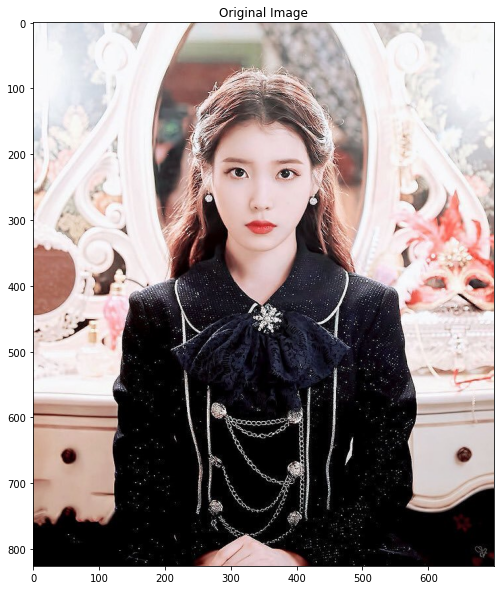

In [ ]:
# 파일 불러오기
plt.rcParams["figure.figsize"] = (10,10)
img_path = '/content/gdrive/MyDrive/aiffel/ex_10/data/001.jpg'  # 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요. 
img_orig = cv2.imread(img_path) 
print ("- 이미지의 크기는:", img_orig.shape)

img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.title('Original Image')

plt.show()

In [ ]:
# 저장할 파일 이름 결정
model_file = '/content/gdrive/MyDrive/aiffel/ex_10/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file)

('/content/gdrive/MyDrive/aiffel/ex_10/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f9602096ad0>)

In [ ]:
res = requests.get(model_url)
with open(model_file, 'wb') as model:
    model.write(res.content)

In [ ]:
# 모델 준비
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

### 2. 세그맨테이션으로 분리하기

In [ ]:
# 모델에 이미지 입력
segvalues, output = model.segmentAsPascalvoc(img_path)

In [ ]:
# PASCAL VOC데이터의 라벨 종류 확인
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

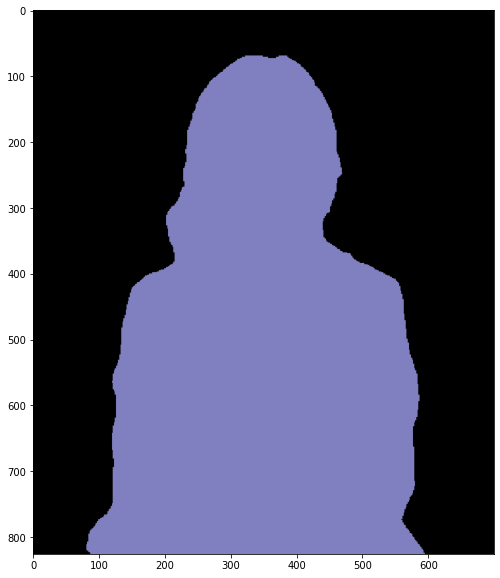

In [ ]:
plt.imshow(output)
plt.show()

In [ ]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [ ]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


output에는 세그멘테이션이 된 결과가 각각 다른 색상으로 담겨있다.
segvalues에는 class_ids와 masks가 있다.
class_ids를 통해 어떤 물체가 담겨있는지 알 수 있다.

### 3. 시맨틱 세그멘테이션 다뤄보기

In [ ]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [ ]:
# 마스크 생성
colormap[15]

array([192, 128, 128])

In [ ]:
seg_color = (128,128,192)

(826, 700)


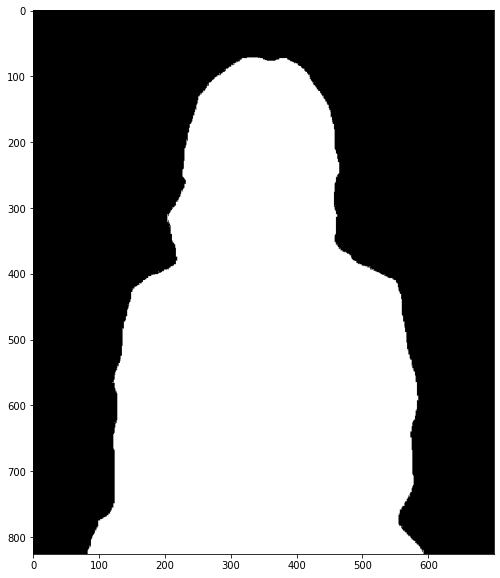

In [ ]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

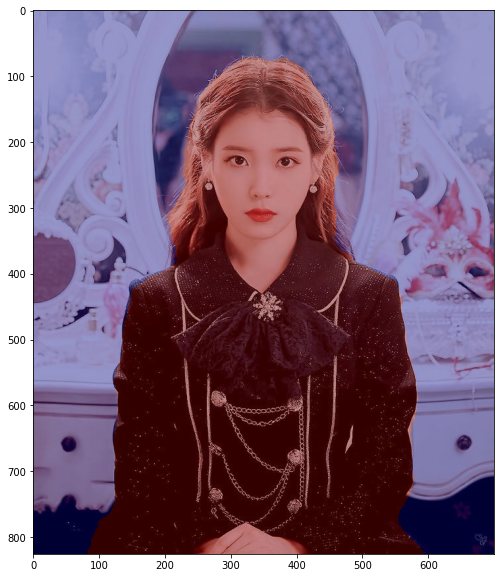

In [ ]:
# 원본 이미지와 겹치기
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### 4. 배경 흐리게 하기

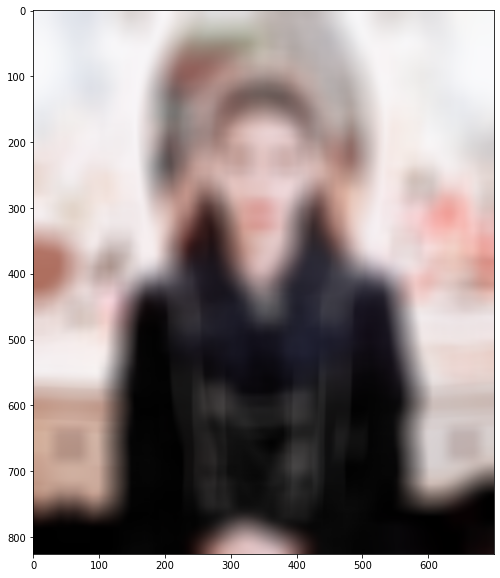

In [ ]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(img_orig, (50,50))  # 50, 50으로 변경
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

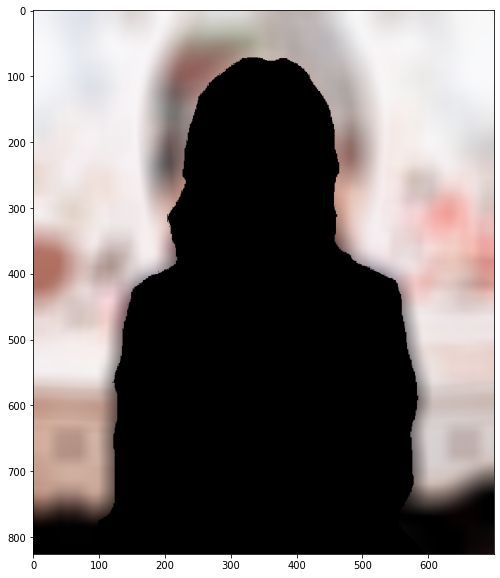

In [ ]:
# 세그멘테이션 마스크를 이용해서 배경만 추출
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

### 5. 흐린 배경과 원본 영상 합성

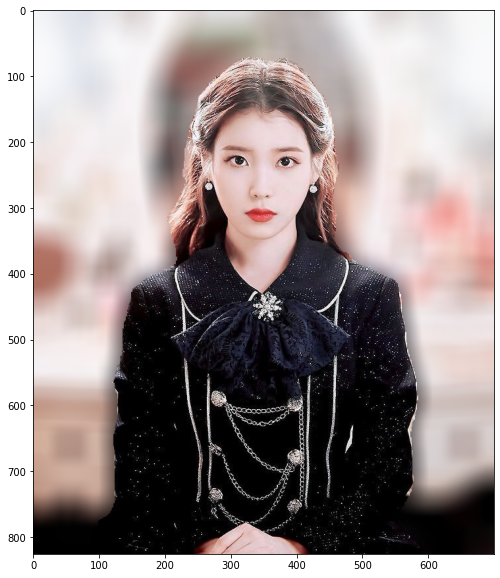

In [ ]:
# 원본 이미지와 합성하기
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

<br>

#### - 사진에서 문제점 찾기

![0001](https://user-images.githubusercontent.com/100528803/172469400-9f1f8a13-2109-48bf-921b-9b42f06562a1.png)


1. 제대로 분류가 되지 않았는지 각기 머리카락들이 잘려나간게 보였다.
2. 사실 쉬운 사진인데도 불구하고 블러의 경계가 고르지 않은 것도 확인되었다.
3. 블러가 50가량 들어가니까 확실히 인물 주위에 블러처리가 먹어서 오히려 자연스러운 포커싱이 힘들어졌다.( 조금만 했으면 무난했겠지만 일단 첫 실험용이니까 쏘쏘한 걸로)

## ✔️고양이 사진으로 진행하기
---
### Step 1. 고양이로 바꿔서 해보기

- 이미지의 크기는: (961, 720, 3)


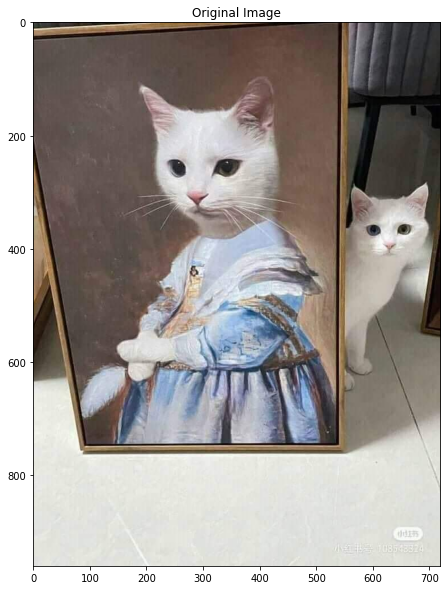

In [ ]:
# 파일 불러오기
plt.rcParams["figure.figsize"] = (10,10)
img_path = '/content/gdrive/MyDrive/aiffel/ex_10/data/고양이/20220521_205213.jpg'  # 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요. 
img_orig = cv2.imread(img_path) 
print ("- 이미지의 크기는:", img_orig.shape)

img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.title('Original Image')

plt.show()

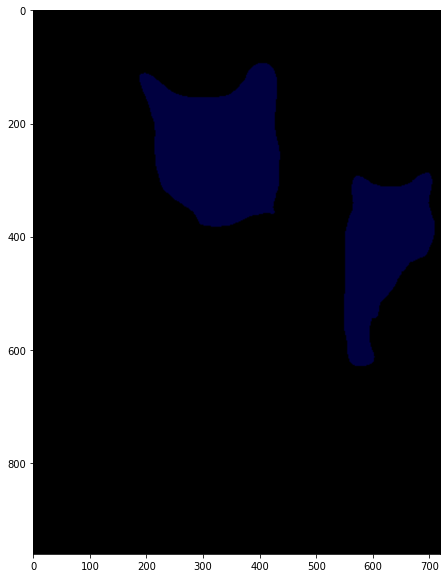

In [ ]:
# 모델에 이미지 입력
segvalues, output = model.segmentAsPascalvoc(img_path)
plt.imshow(output)
plt.show()

In [ ]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
cat


In [ ]:
colormap[8]

array([64,  0,  0])

In [ ]:
seg_color = (0,0,64)

(961, 720)


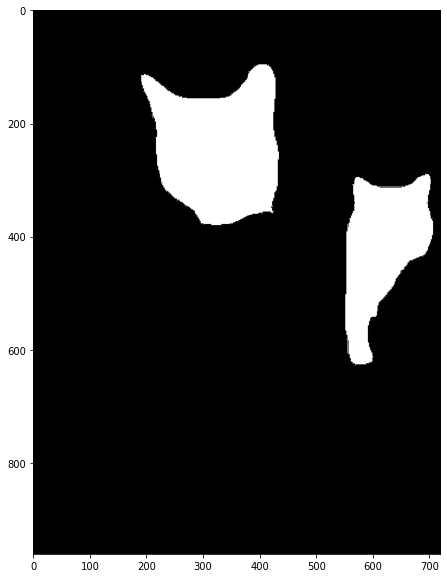

In [ ]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

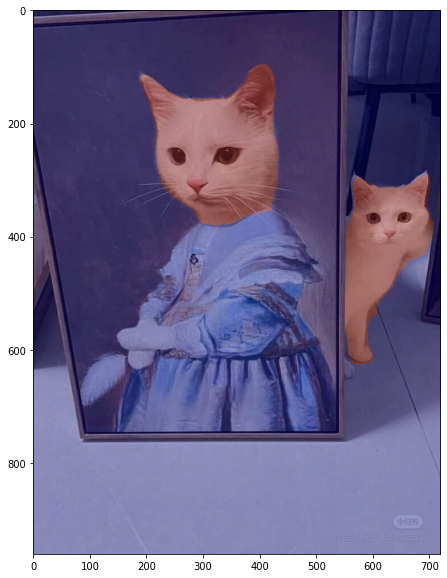

In [ ]:
# 원본 이미지와 겹치기
img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

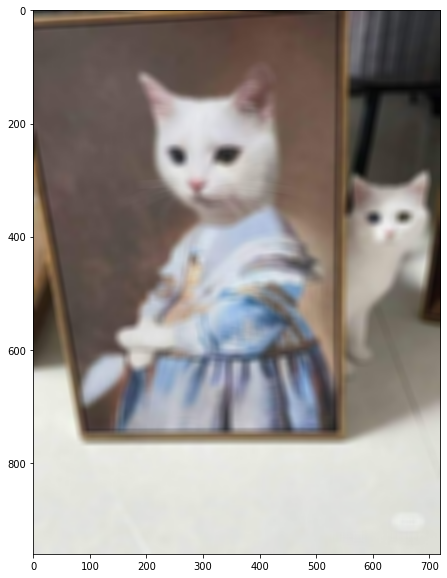

In [ ]:
#blurring kernel size
img_orig_blur = cv2.blur(img_orig, (15,15))  # 15, 15로 변경
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

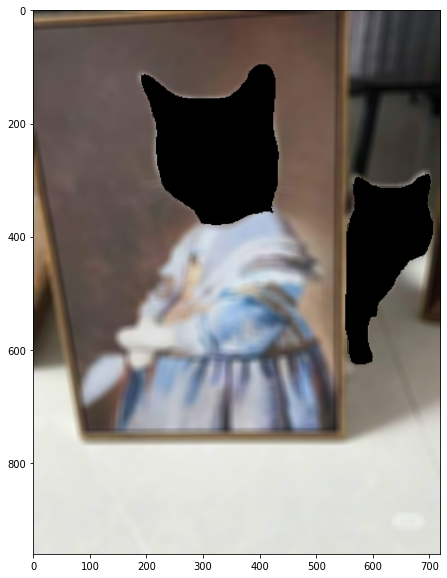

In [ ]:
# 세그멘테이션 마스크를 이용해서 배경만 추출
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

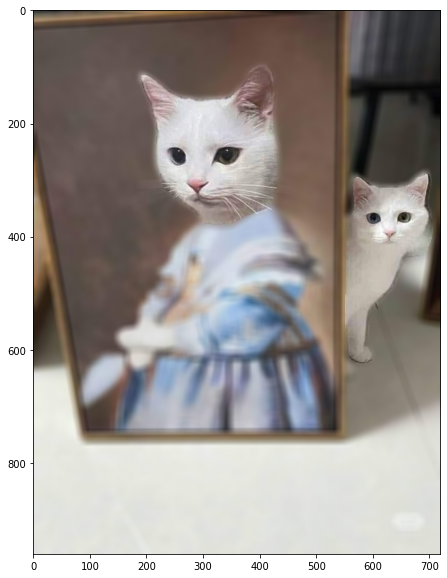

In [ ]:
# 원본 이미지와 합성하기
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

<br>

#### - 사진에서 문제점 찾기 : 고양이로 바꿔서 해보기

![11_](https://user-images.githubusercontent.com/100528803/172531112-74a25704-e2a7-4073-a68e-41467a528d1f.png)

1. 라벨에 따라 고양이로 생각되는 얼굴이랑 뒤의 고양이 부분은 제대로 잘 구분된 걸 확인할 수 있었다.
2. 하지만 초상화 내의 옷 같은 경우 옷 내지는 흡사 사람이라는 라벨조차 잡히지 않는 걸로 봐서 반만 맞춘 정답이라고 할 수 있다.

사실 이 사진의 경우 넌센스였는데, 모델이 정직하다고 볼 수도 있고, 다른 말로 하면 응용력이 없다고 볼 수 있다. 사실 이건 어떻게 라벨링하는게 옳은 방법인지 고민된다.

<br>

## ✔️배경 크로마키 합성하기
---
### Step 3. 고양이 사진 뒤에 배경 합성해주기


- 이미지의 크기는: (2048, 2048, 3)


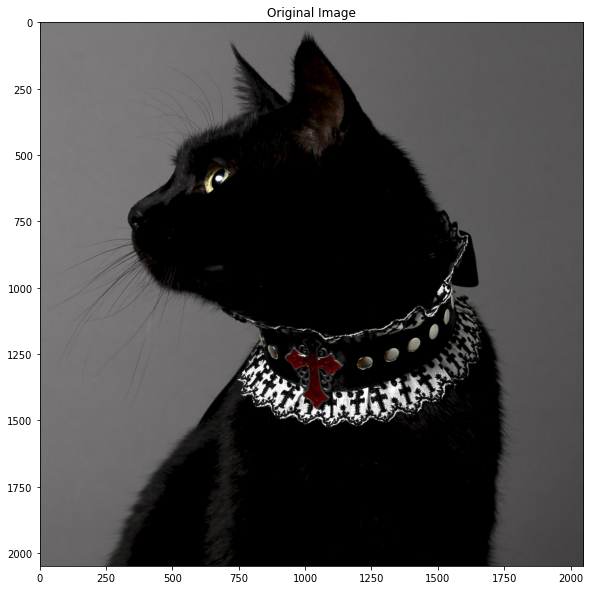

In [ ]:
# 파일 불러오기
plt.rcParams["figure.figsize"] = (10,10)
img_path = '/content/gdrive/MyDrive/aiffel/ex_10/data/고양이/20220130_033835.jpg'  # 본인이 선택한 이미지의 경로에 맞게 바꿔 주세요. 
img_orig = cv2.imread(img_path) 
print ("- 이미지의 크기는:", img_orig.shape)

img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.title('Original Image')

plt.show()

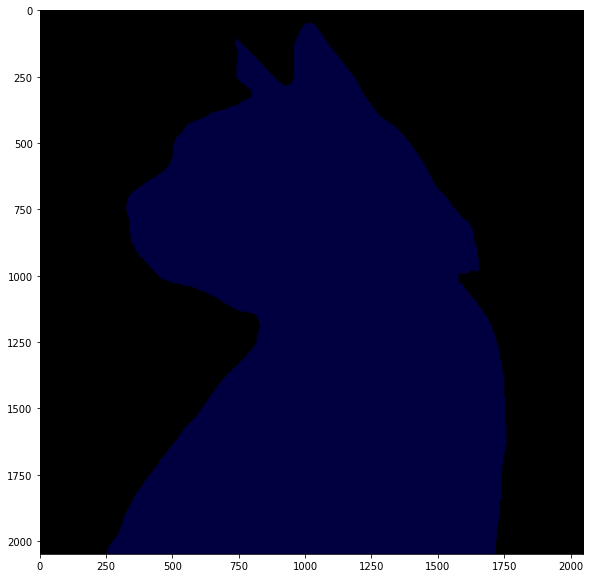

In [ ]:
# 모델에 이미지 입력
segvalues, output = model.segmentAsPascalvoc(img_path)
plt.imshow(output)
plt.show()

In [ ]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])
colormap[8]

background
cat


array([64,  0,  0])

(2048, 2048)


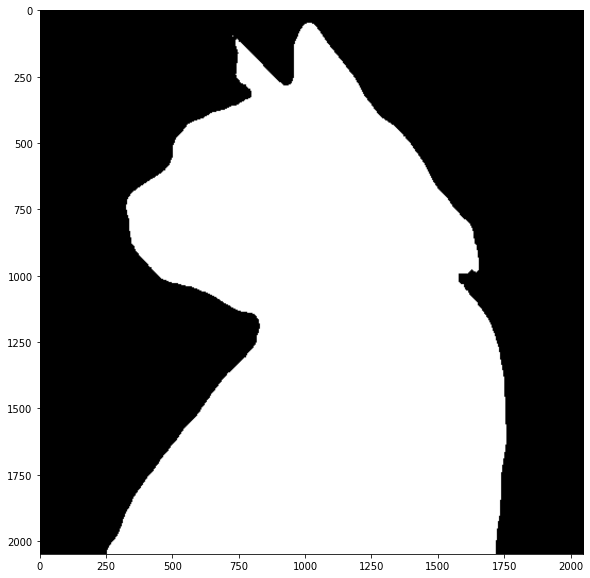

In [ ]:
# 마스크 생성
seg_color = (0,0,64)

# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.imshow(seg_map, cmap='gray')
plt.show()

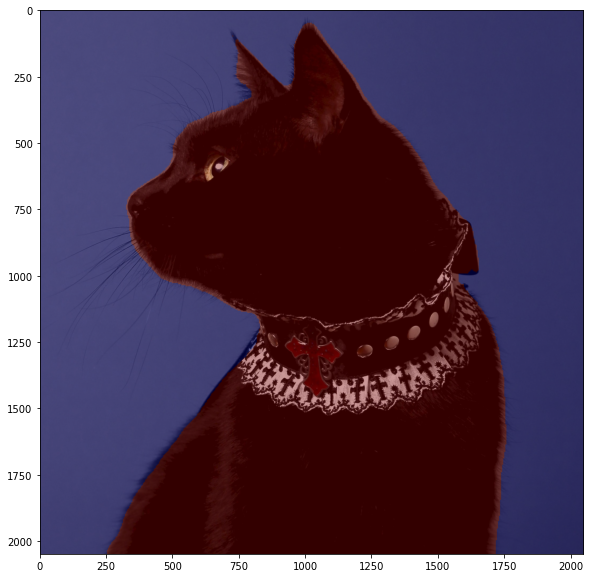

In [ ]:
# 원본 이미지와 겹치기
img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

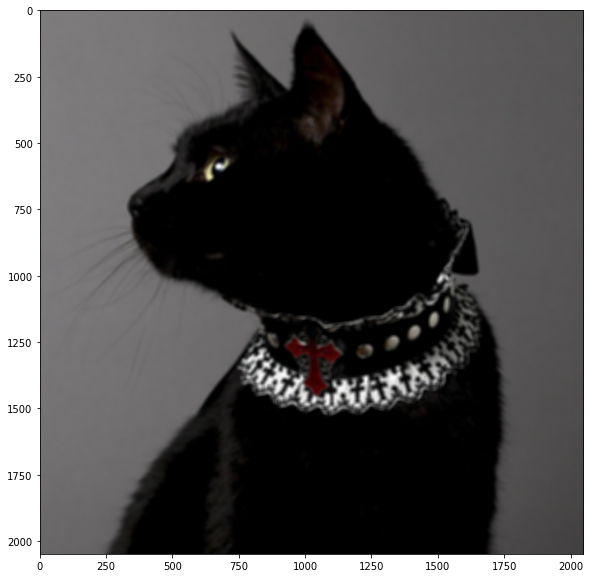

In [ ]:
#blurring kernel size
img_orig_blur = cv2.blur(img_orig, (15,15))  # 15, 15로 변경
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

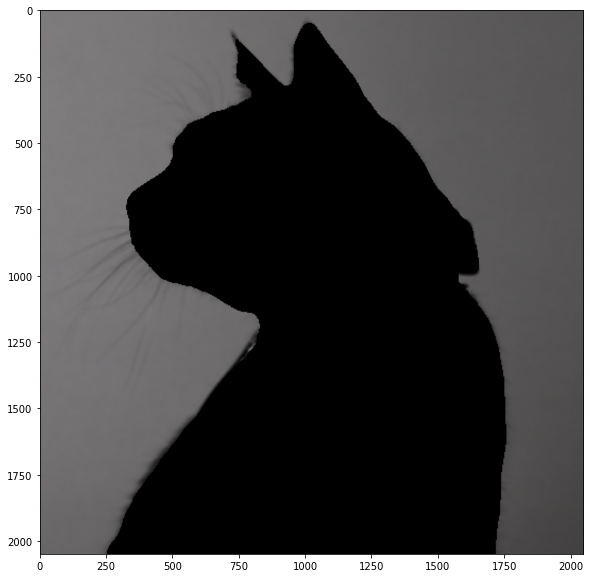

In [ ]:
# 세그멘테이션 마스크를 이용해서 배경만 추출
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

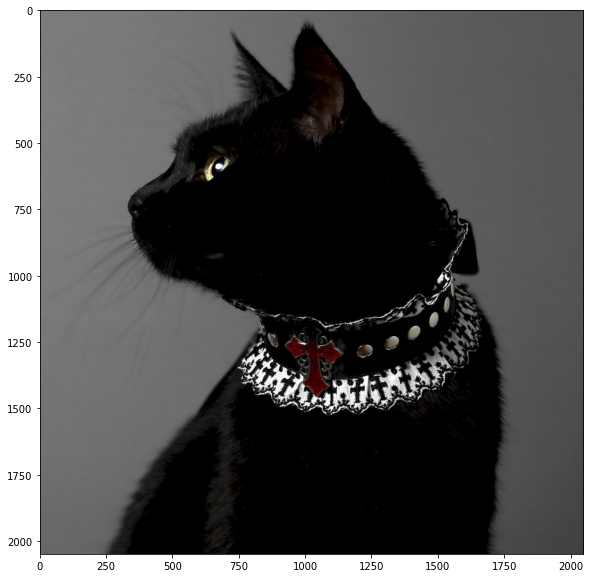

In [ ]:
# 원본 이미지와 합성하기
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

(853, 1280, 3)


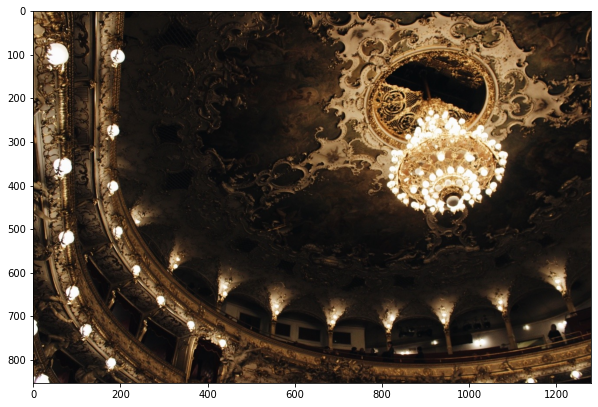

In [ ]:
# 배경으로 쓸 파일 불러오기
back_path = '/content/gdrive/MyDrive/aiffel/ex_10/data/배경/20220325_061439.jpg' 
back_orig = cv2.imread(back_path) 

print(back_orig.shape)
plt.imshow(cv2.cvtColor(back_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# 배경을 원본 파일에 맞춰서 리사이즈
back_resized = cv2.resize(back_orig, (img_orig.shape[1], img_orig.shape[0]))

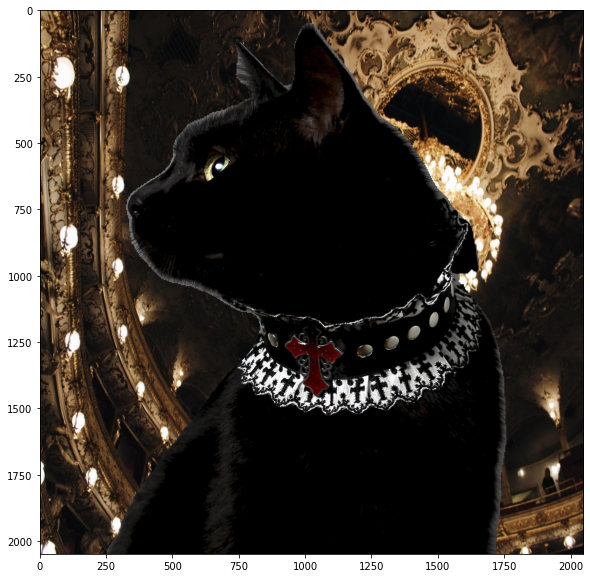

In [ ]:
# 배경과 원본의 고양이를 같이 합성하기
back_concat = np.where(img_mask_color == 255, img_orig, back_resized)
plt.imshow(cv2.cvtColor(back_concat, cv2.COLOR_BGR2RGB))
plt.show()

<br>

#### - 사진에서 문제점 찾기 : 배경 크로마키 합성하기

![22_1_](https://user-images.githubusercontent.com/100528803/172540702-c899b229-b86d-4b31-b186-9be5056542ea.png)

1. 제대로 된 그림을 얻고 싶다면 배경의 비율과 원본 사진과의 비율을 제대로 맞추는게 중요해 보인다.
2. 고양이 사진에서 외곽선이 배경색을 살짝 더해져서 추출한 덕분에 실루엣처럼 자연스럽긴 하지만 그래도 완전히 자연스럽지는 않다.

<br>

## ✔️여러 상황에서 문제점 찾아보기
---
### 1-1. 복잡한 배경에서 얼마나 잘 구별할 수 있을까?

In [ ]:
# 이미지 열기 함수
plt.rcParams["figure.figsize"] = (20,10)
def OpenFile(img_path):          
    img_orig = cv2.imread(img_path) 
    print("- 이미지의 크기는:", img_orig.shape)
    img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title('[ - Original Image - ]', fontsize='20')
    plt.show()

# 마스크 추출 함수
def Segmentation(img_path):    
    img_orig = cv2.imread(img_path) 
    img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
    segvalues, output = model.segmentAsPascalvoc(img_path)    
    print('------------------------------------------------')
    print(segvalues)
    for class_id in segvalues['class_ids']:
        print(LABEL_NAMES[class_id])
    print('------------------------------------------------')
    colormap = np.zeros((256, 3), dtype = int)
    ind = np.arange(256, dtype=int)
    for shift in reversed(range(8)):
        for channel in range(3):
            colormap[:, channel] |= ((ind >> channel) & 1) << shift
        ind >>= 3
    print(colormap[:20])
    print('------------------------------------------------')
    plt.title('[ - Segmentation Image - ]', fontsize='20')
    plt.imshow(output)

# 마스크랑 이미지 결합 함수
def MaskAdd(img_path, number1, number2, number3):    
    img_orig = cv2.imread(img_path) 
    img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
    segvalues, output = model.segmentAsPascalvoc(img_path)
    for class_id in segvalues['class_ids']:
        print(LABEL_NAMES[class_id])
    seg_color = (number1, number2, number3)

    # seg_color로만 이루어진 마스크 만들기
    # output의 픽셀 별로 색상이 seg_color와 같으면 1(True), 다르면 0(False)가 됨
    seg_map = np.all(output == seg_color, axis = -1)
    print(seg_map.shape)
    img_show = img_orig.copy()
    # True와 False인 값을 각각 255, 0으로 바꿔줌
    img_mask = seg_map.astype(np.uint8) * 255   # astype : 데이터프레임 타입 바꾸기

    # 255와 0을 적당한 색상으로 바꿈
    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    # 원본 이미지와 마스크 합치기
    img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)
    plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
    plt.title('[ - Mask Image - ]', fontsize='20')
    plt.show()

- 이미지의 크기는: (850, 2000, 3)


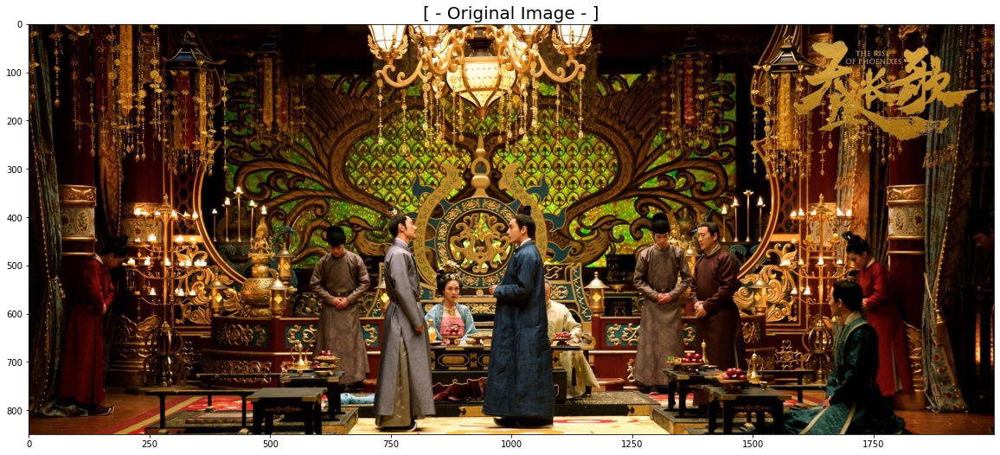

In [ ]:
# 함수 테스트1
OpenFile('/content/gdrive/MyDrive/aiffel/ex_10/data/plus/back_01.jpg')

------------------------------------------------
{'class_ids': array([ 0, 15]), 'masks': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])}
background
person
------------------------------------------------
[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
------------------------------------------------


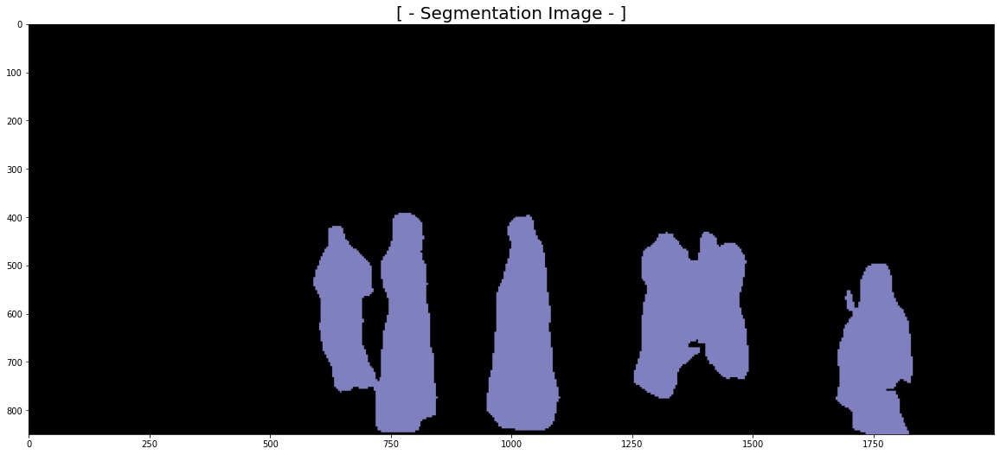

In [ ]:
# 함수 테스트2
Segmentation('/content/gdrive/MyDrive/aiffel/ex_10/data/plus/back_01.jpg')

background
person
(850, 2000)


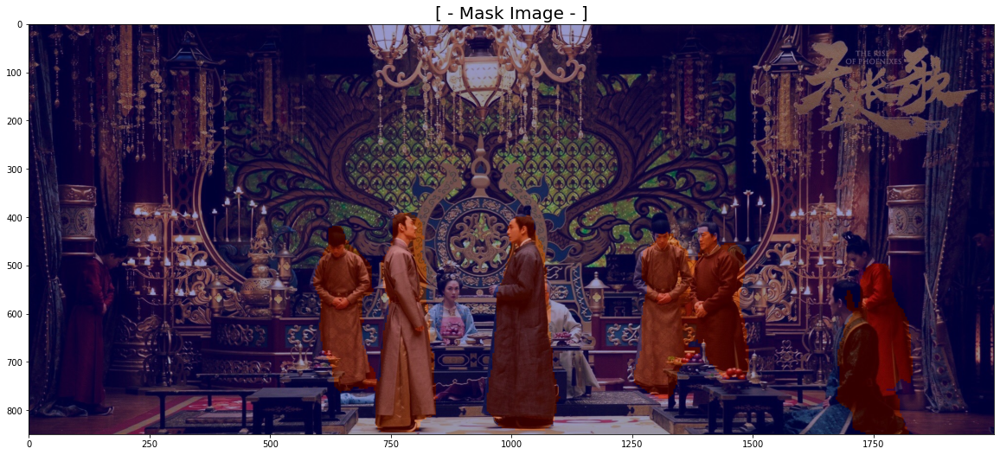

In [ ]:
# 함수 테스트3
MaskAdd('/content/gdrive/MyDrive/aiffel/ex_10/data/plus/back_01.jpg', 128, 128, 192)

In [ ]:
# 2번째 파일
img_path = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/back_02.png'
OpenFile(img_path)
MaskAdd(img_path, 128, 128, 192)

Output hidden; open in https://colab.research.google.com to view.

<br>

#### - 사진에서 문제점 찾기 : 복잡한 배경에서 얼마나 잘 구별할 수 있을까?
![배경](https://user-images.githubusercontent.com/100528803/172689314-812ee7bc-a5ac-403b-ba8a-a2c5b182da99.png)

1. 마스크를 찬찬히 보면 사람들만 따로 뺐는데도 불구하고 몇몇 사람들은 제대로 인식되지 않는 것을 확인할 수 있었다.
2. 특히 중간에 앉아있는 사람은 하체가 잘려서, 옆에 아예 얼굴이 안나온 사람도 마스크로 잡히지 않았고, 오른쪽 아래의 경우 어느정도 잡히긴 했으나 제대로 사람의 형상이 나오진 않았다.
3. 두번째 사진의 경우 어느정도 다 뽑아내기는 했지만 아무래도 용포의 무늬가 뒤쪽의 배경이랑 흡사해서인지 몇몇 부분들이 제대로 잡히지 않는 것을 확인했다.

<br>

### 1-2. 레이블을 얼마나 정확히 구별할 수 있을까?
---



In [ ]:
# 사람 구별하기
img_path_1 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/human_00.jpg'
img_path_2 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/human_01.jpg'

# 1번째 파일
OpenFile(img_path_1)
Segmentation(img_path_1)
MaskAdd(img_path_1, 128, 128, 192)

# 2번째 파일
OpenFile(img_path_2)
Segmentation(img_path_2)
MaskAdd(img_path_2, 128, 128, 192)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 그림 구별하기
img_path_1 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/pic_01.jpg'
img_path_2 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/pic_02.jpg'
img_path_3 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/pic_04.jpg'

# 1번째 파일
OpenFile(img_path_1)
Segmentation(img_path_1)
MaskAdd(img_path_1, 128, 128, 192)

# 2번째 파일
OpenFile(img_path_2)
Segmentation(img_path_2)
MaskAdd(img_path_2, 128, 128, 192)

# 3번째 파일
OpenFile(img_path_3)
Segmentation(img_path_3)
MaskAdd(img_path_3, 128, 128, 192)

Output hidden; open in https://colab.research.google.com to view.

- 이미지의 크기는: (1000, 688, 3)


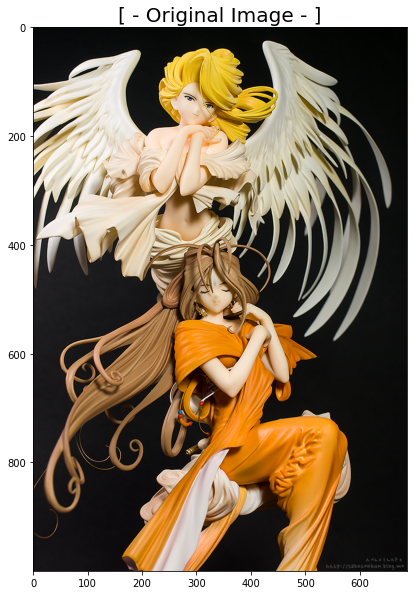

------------------------------------------------
{'class_ids': array([ 0,  2,  3, 16]), 'masks': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])}
background
bicycle
bird
pottedplant
------------------------------------------------
[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
------------------------------------------------
background
bicycle
bird
pottedplant
(1000, 688)


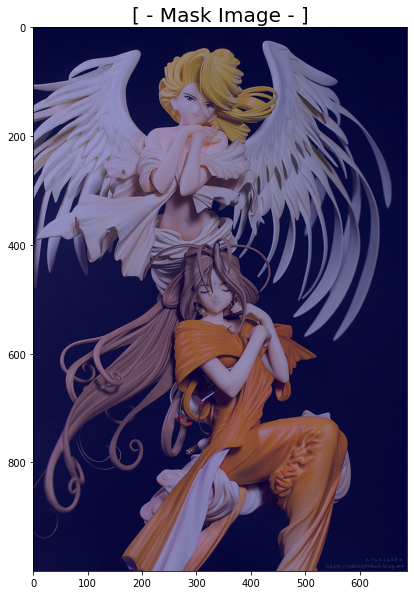

- 이미지의 크기는: (996, 747, 3)


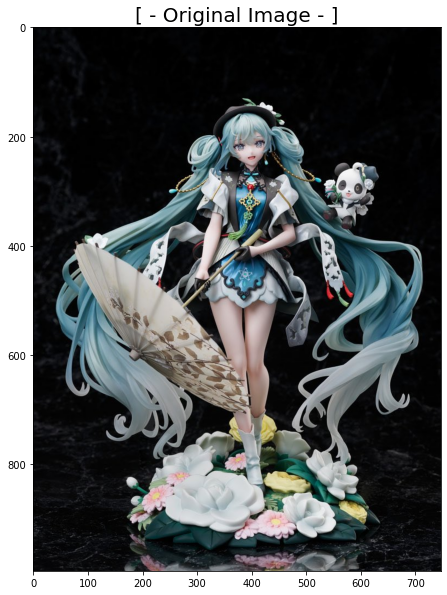

------------------------------------------------
{'class_ids': array([ 0, 15]), 'masks': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])}
background
person
------------------------------------------------
[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
------------------------------------------------
background
person
(996, 747)


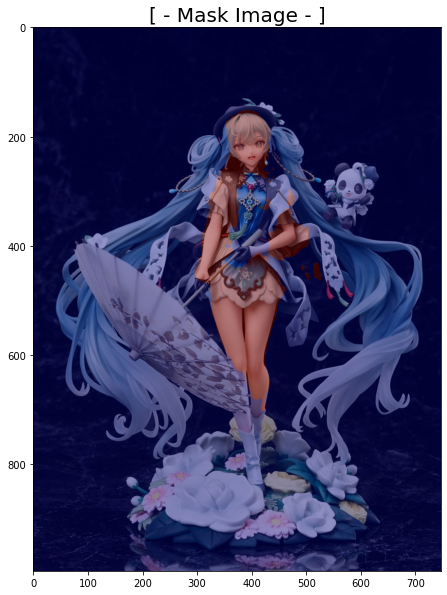

In [ ]:
# 피규어 구별하기(사람으로 인식할까?)
img_path_1 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/fi_00.png'
img_path_2 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/fi_01.jpg'

# 1번째 파일
OpenFile(img_path_1)
Segmentation(img_path_1)
MaskAdd(img_path_1, 128, 128, 192)

# 2번째 파일
OpenFile(img_path_2)
Segmentation(img_path_2)
MaskAdd(img_path_2, 128, 128, 192)

------------------------------------------------
{'class_ids': array([ 0,  2,  3, 16]), 'masks': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])}
background
bicycle
bird
pottedplant
------------------------------------------------
[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
------------------------------------------------


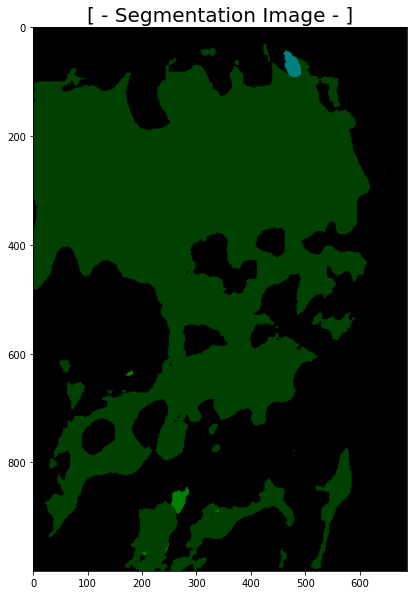

In [ ]:
Segmentation('/content/gdrive/MyDrive/aiffel/ex_10/data/plus/fi_00.png')

<br>

#### - 사진에서 문제점 찾기 : 레이블을 얼마나 정확히 구별할 수 있을까?

1. 사람의 형체이지만 베일로 인해 알아보기 힘든 경우
![사람](https://user-images.githubusercontent.com/100528803/172689329-c3ed5fc1-89a3-4f83-bbb7-5a0418796db4.png)
- 이 경우 일부러 불투명과 투명한 그림을 각기 사용했는데, 하나는 사람으로 인식하는 경우가 극히 일부분이었고, 대부분을 새나 다른 사물로 판단했다.
- 두번째의 경우 그나마 사람의 형체를 어느정도 잡긴 했지만 반투명한 베일의 엣지 때문에 손이랑 머리까지 온전히 인식되진 않았다.

2.
![그림](https://user-images.githubusercontent.com/100528803/172689340-55e0bae9-f712-405e-872a-c8c74130646e.png)
- 처음 그림은 펜 바를렌의 스케치 작품인데, 이분은 디테일한 실사화에 강한 분이다. 그래서인지 인물의 형체를 제대로 잡아낸 스케치에서는 사람의 형체를 그대로 인식하는 것을 확인할 수 잇엇다.
- 두번째는 유화 스타일 일러스트인데 일상적인 데이터셋으로 훈련된 모델인건지 드레스 자체를 인식하지 못하는게 보였다. 이건 사실 위에서 고양이때도 드레스 인식을 못한거랑 연장선상으로 느껴졌다.

3.
![세그멘테이션2](https://user-images.githubusercontent.com/100528803/172689363-bfc0fefb-0dfb-4749-a464-1ddd3724e6e2.png)
- 세번째는 사람 형상을 본뜬 애니메이션 캐릭터들의 피규어였는데, 그중에서도 일반적인게 아니라 크리처 형상들이 같이 합쳐진 걸 가져왔다. 그 결과 새나 다른 사물로의 인식은 가능하지만, 사람으로서 구분하진 못했다.
- 라벨값을 제대로 받아오지 못한 마스크의 경우, 애초에 원본 위에 얹어봤자 무의미하므로 이대로 스탑했다.

<br>

### 1-3. 여러개의 사물은 얼마나 잘 구분할 수 있을까?
---

- 이미지의 크기는: (931, 1024, 3)


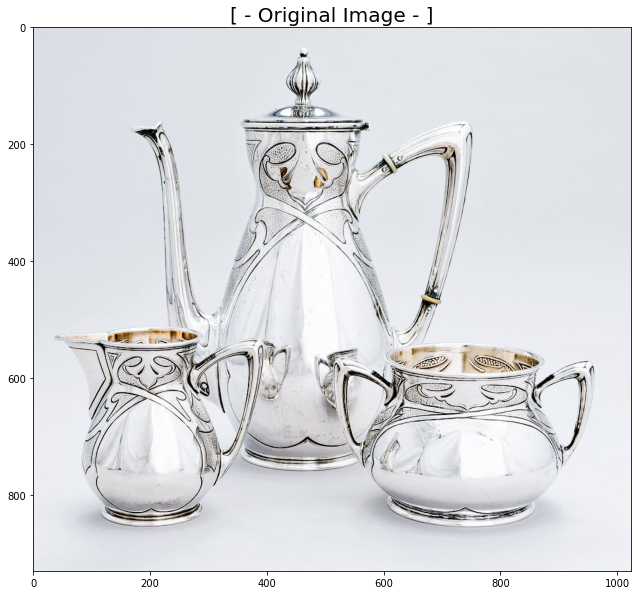

------------------------------------------------
{'class_ids': array([ 0, 11]), 'masks': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])}
background
diningtable
------------------------------------------------
[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
------------------------------------------------


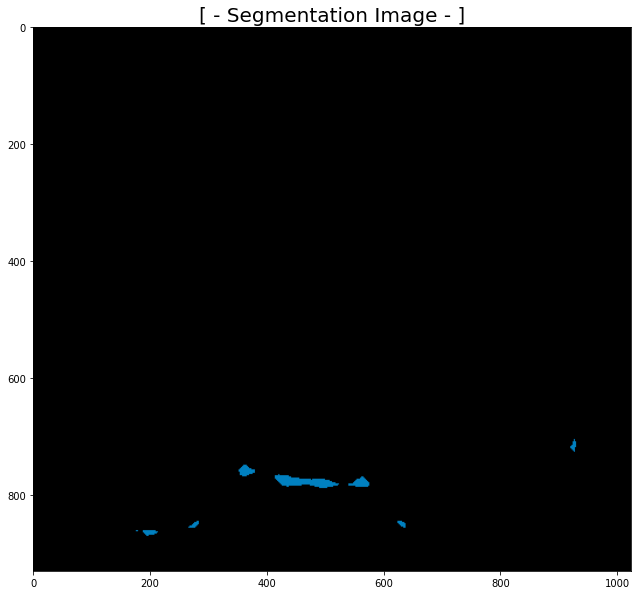

In [ ]:
# 무생물
img_path_1 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/multi_01.jpg'
img_path_2 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/multi_04.jpg'

# 1번째 파일
OpenFile(img_path_1)
Segmentation(img_path_1)

- 이미지의 크기는: (2800, 4096, 3)


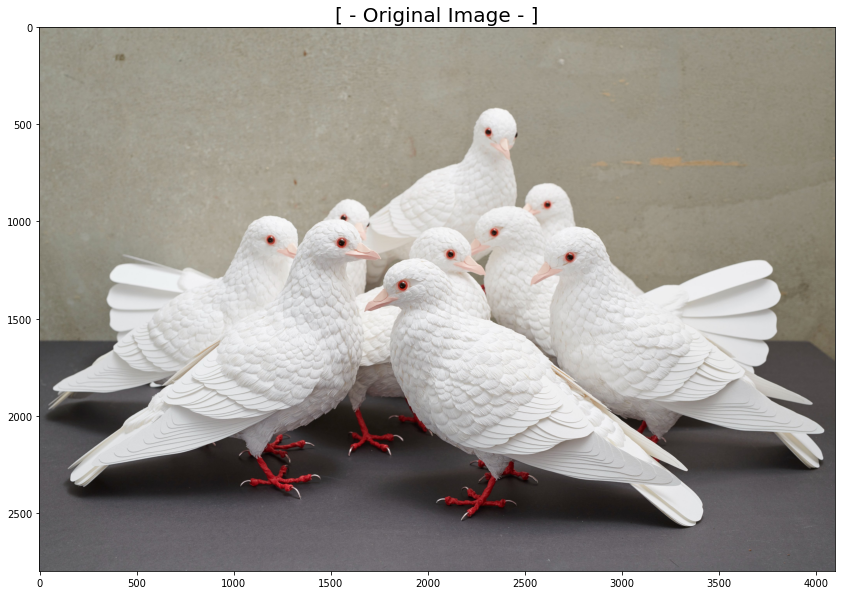

------------------------------------------------
{'class_ids': array([0, 3]), 'masks': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])}
background
bird
------------------------------------------------
[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
------------------------------------------------


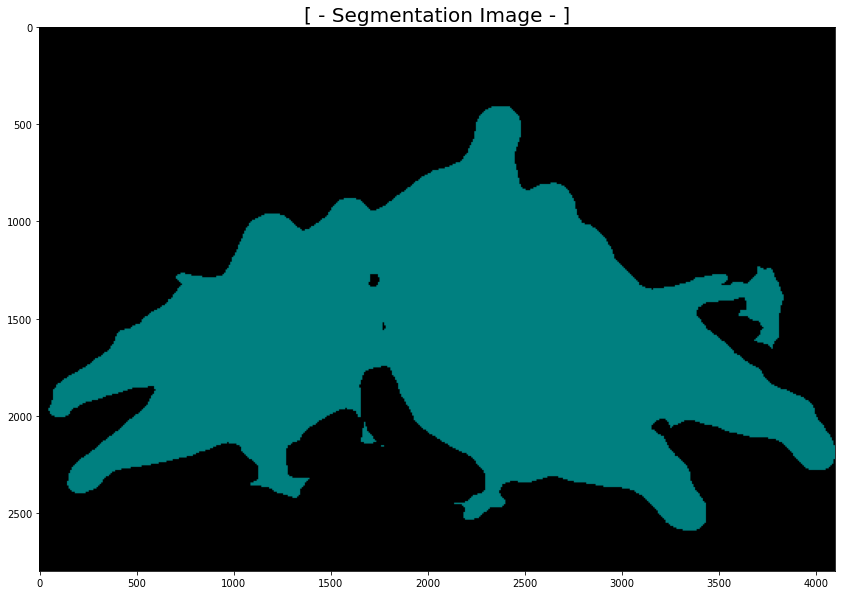

In [ ]:
# 생물
img_path_1 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/multi_02.jpg'

# 1번째 파일
OpenFile(img_path_1)
Segmentation(img_path_1)

- 이미지의 크기는: (445, 750, 3)


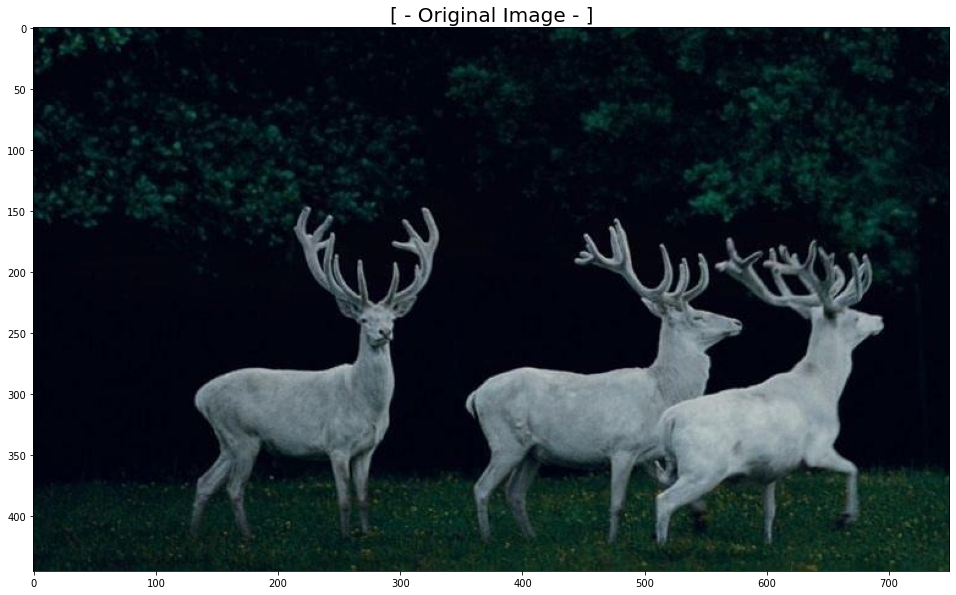

------------------------------------------------
{'class_ids': array([ 0, 17]), 'masks': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])}
background
sheep
------------------------------------------------
[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
------------------------------------------------


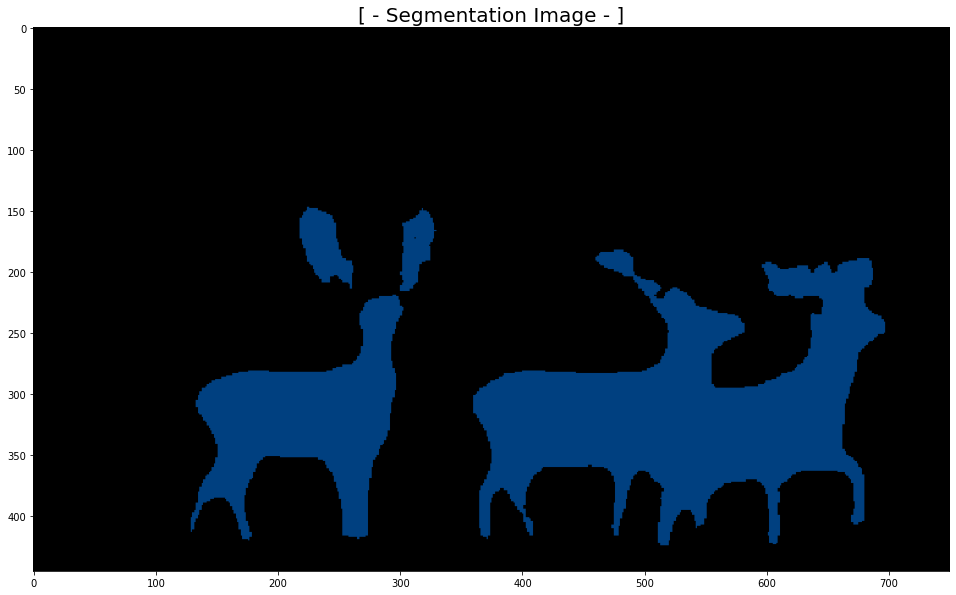

In [ ]:
img_path_2 = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/multi_03.jpg'

# 2번째 파일
OpenFile(img_path_2)
Segmentation(img_path_2)

background
bird
(2800, 4096)


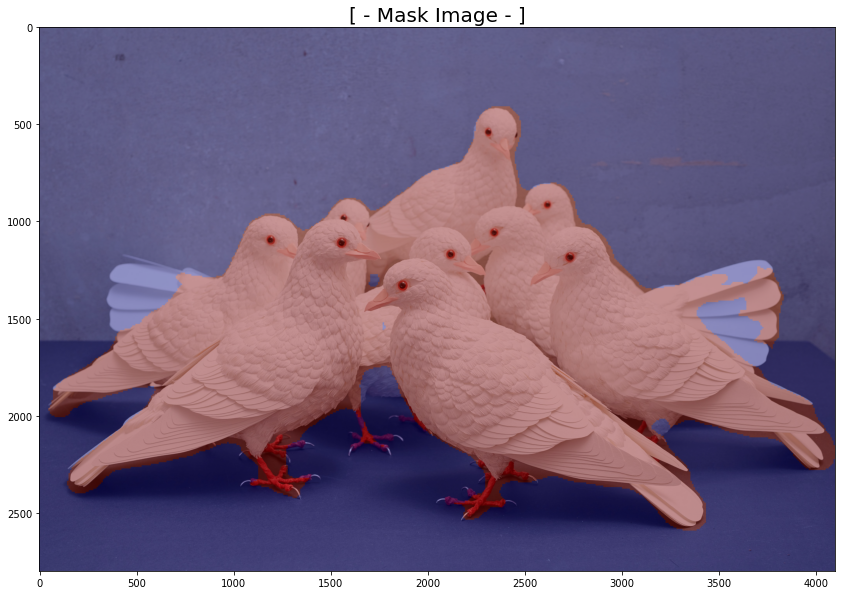

background
sheep
(445, 750)


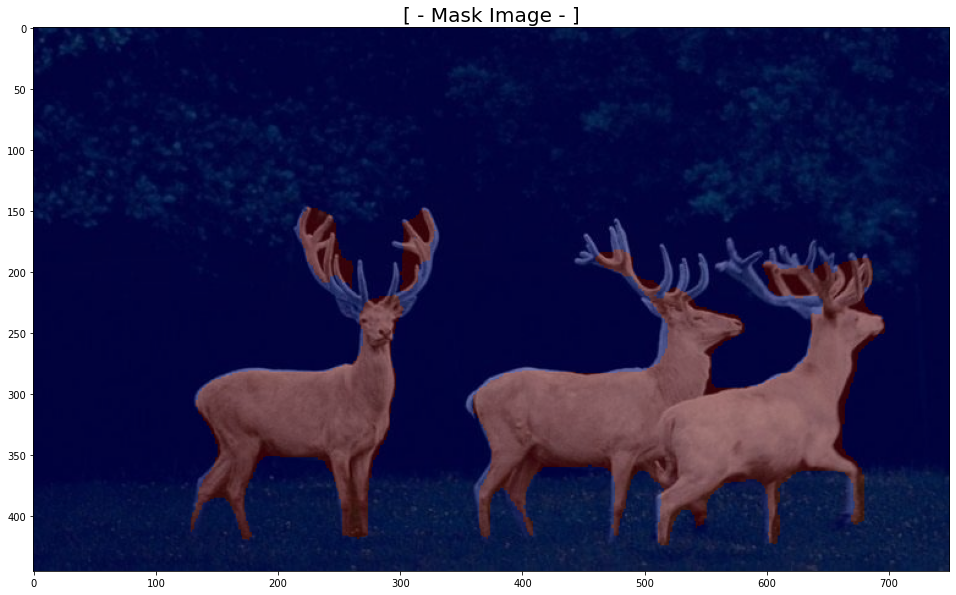

In [ ]:
# 마스킹 결과
MaskAdd(img_path_1, 0, 128, 128)
MaskAdd(img_path_2, 0, 64, 128)

- 이미지의 크기는: (626, 540, 3)


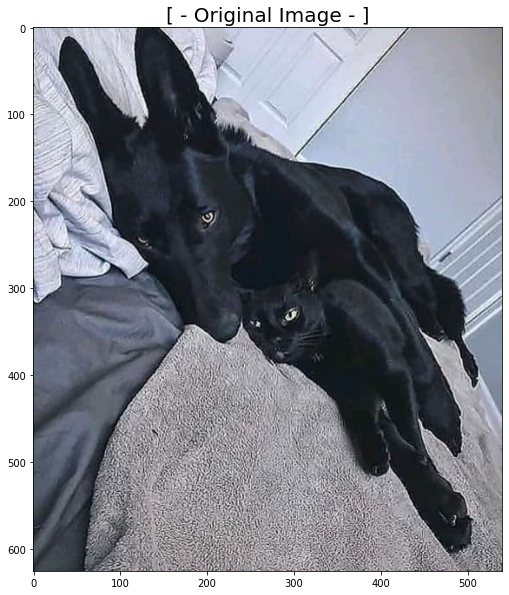

------------------------------------------------
{'class_ids': array([ 0,  3,  8, 12, 13, 15]), 'masks': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])}
background
bird
cat
dog
horse
person
------------------------------------------------
[[  0   0   0]
 [128   0   0]
 [  0 128   0]
 [128 128   0]
 [  0   0 128]
 [128   0 128]
 [  0 128 128]
 [128 128 128]
 [ 64   0   0]
 [192   0   0]
 [ 64 128   0]
 [192 128   0]
 [ 64   0 128]
 [192   0 128]
 [ 64 128 128]
 [192 128 128]
 [  0  64   0]
 [128  64   0]
 [  0 192   0]
 [128 192   0]]
------------------------------------------------


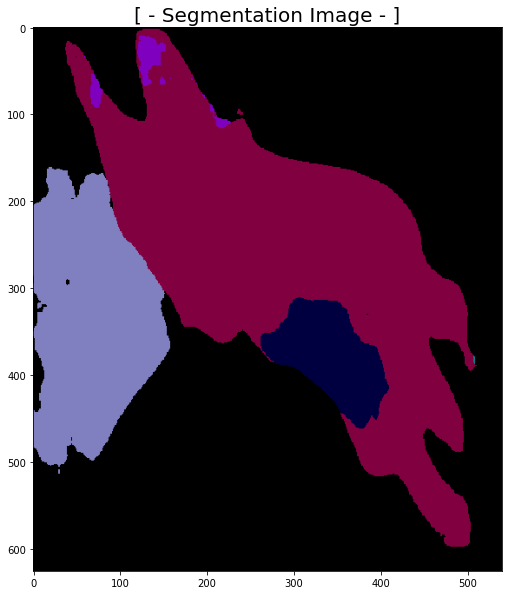

In [ ]:
img_path_3 = '/content/gdrive/MyDrive/aiffel/ex_10/data/고양이/20210705_103733.jpg'

# 3번째 파일
OpenFile(img_path_3)
Segmentation(img_path_3)

background
bird
cat
dog
horse
person
(626, 540)


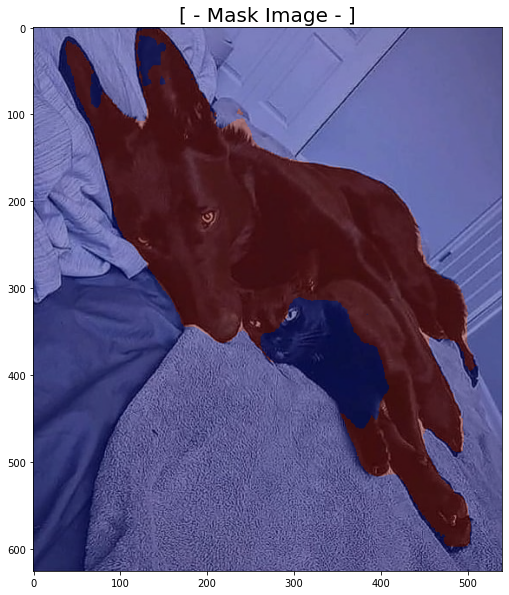

In [ ]:
MaskAdd(img_path_3, 128, 0, 64)

<br>

#### - 사진에서 문제점 찾기 : 여러개의 사물은 얼마나 잘 구분할 수 있을까?
1. 무생물 중에서 식기의 경우
![세그멘테이션1](https://user-images.githubusercontent.com/100528803/172689374-b3450f9f-cdcb-46e9-800d-b01427a072f5.png)

- 사실 식기의 경우 상대적으로 생긴 모양새가 정해져 있는 도구들이기 때문에 인식이 쉬울 것으로 생각했으나, 이역시 제대로 인식하지 못한건 좀 의외였다.
- 그나마 아래쪽의 받침 정도만 인식이 된 상태인데, 아무래도 접시같은 그릇이 가려져 있는 걸 가리키고 싶었던 모양이다.

2. 생물 중에서 몇몇 동물들의 무리
![멀티](https://user-images.githubusercontent.com/100528803/172689383-1d1eca90-7386-4ecf-be1e-1ec390bb7105.png)
- 생물의 경우, 라벨링이 꽤 다양하게 되어있는 것을 확인할 수 있었다. 여러마리의 비둘기의 경우 그래도 앞의 그림들보다는 상대적으로 많이 인식되었으므로 문제로 가져오진 않았다.
- 하지만 사슴의 경우 일단 라벨링부터가 'sheep'으로 되어있는 상태라 조금 의외였고(사실 사슴도 꽤 많이 보이지 않나.. 생각했는데 기준이 가축이라 그런가보다) 뿔의 모양들은 대부분 잘려나갔다.
- 마지막은 같은 검은 빛깔의 개와 고양이가 같이 누워있는 사진인데 색이 거의 같아서 그런가 얼굴부분에서 고양이를 인식하긴 하지만, 몸의 분리는 힘들어보였다.


<br>

## ✔️해결 방법을 제안해 보기
---
### 2-1. 가우시안 블러 이용하기

- 이미지의 크기는: (1080, 1903, 3)


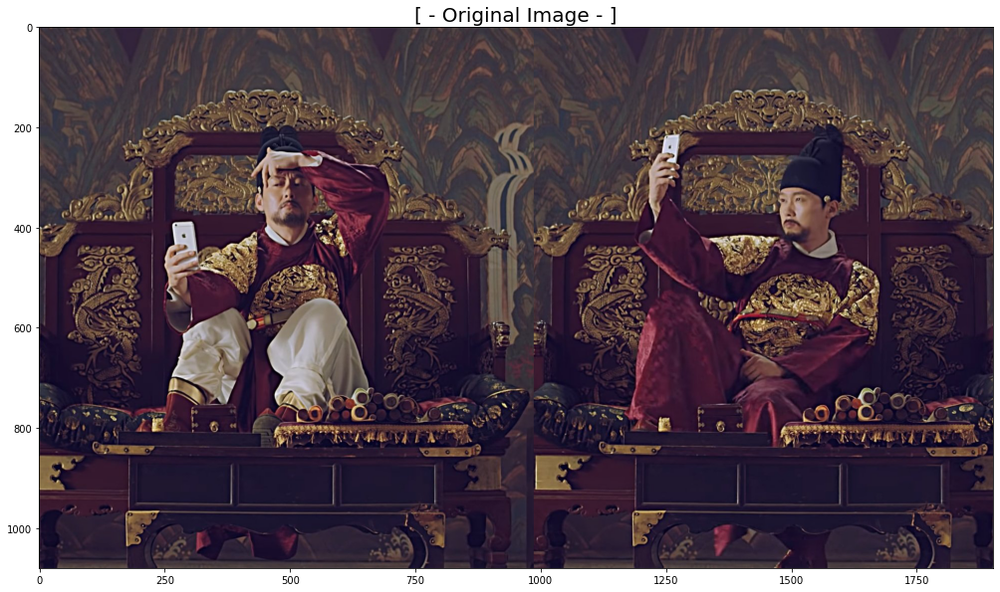

In [ ]:
# 이번에는 함수를 쓰지 않고 온전히 불러옴
plt.rcParams["figure.figsize"] = (20,10)
img_path = '/content/gdrive/MyDrive/aiffel/ex_10/data/plus/back_02.png'
img_orig = cv2.imread(img_path) 
print ("- 이미지의 크기는:", img_orig.shape)
img_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.title('[ - Original Image - ]', fontsize='20')

plt.show()

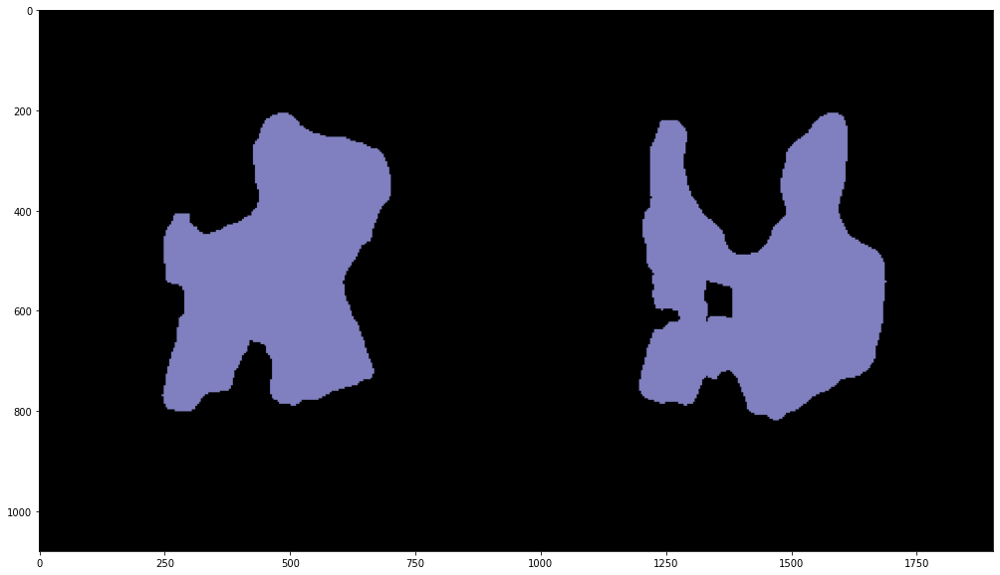

In [ ]:
segvalues, output = model.segmentAsPascalvoc(img_path)
# PASCAL VOC데이터의 라벨 종류 확인
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

plt.imshow(output)
plt.show()

In [ ]:
# 모델에서 나온 출력값 (segvalues)
segvalues
for class_ids in segvalues['class_ids']:
    print(LABEL_NAMES[class_ids])

# 아래 코드 이해하지 않아도 괜찮음 (PixelLib에서 그대로 가져옴)
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)
for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

background
person


array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [ ]:
colormap[15] #사람

array([192, 128, 128])

In [ ]:
seg_color = (128, 128, 192)

(1080, 1903)


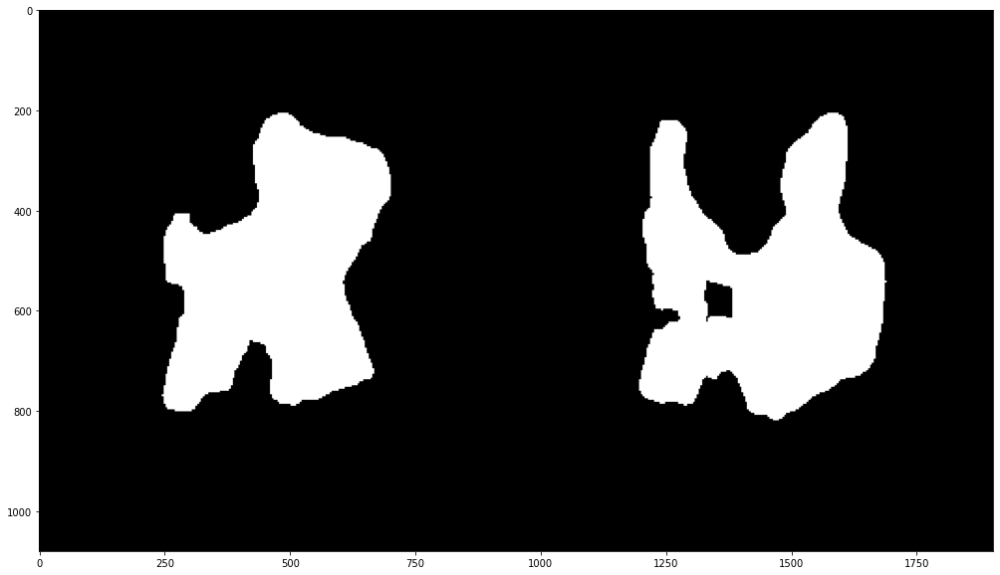

In [ ]:
# seg_color로만 이루어진 마스크 만들기
seg_map = np.all(output == seg_color, axis = -1)
print(seg_map.shape)
plt.imshow(seg_map, cmap = 'gray')
plt.show()

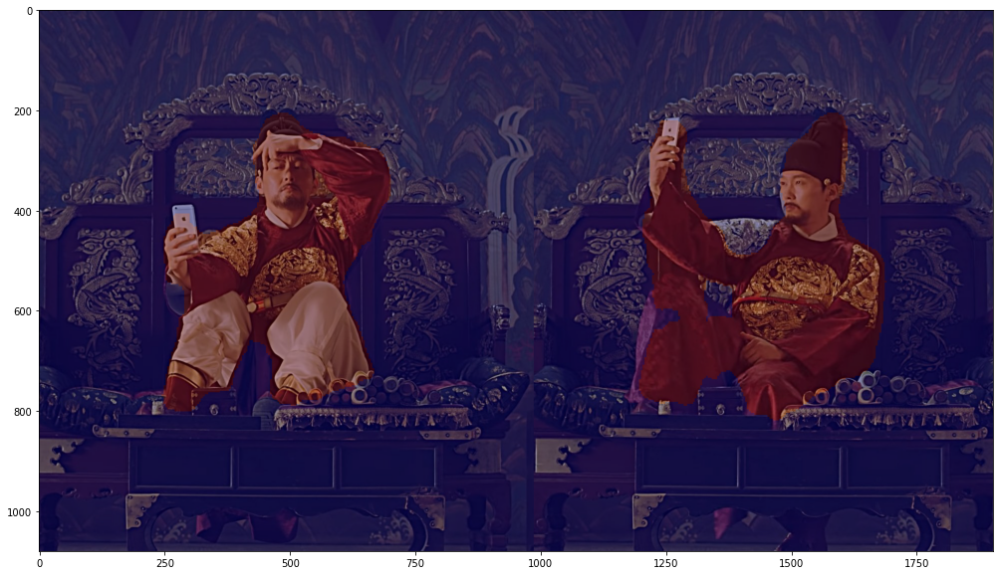

In [ ]:
# 마스크 쓴 이미지를 가져와서 영역을 분리
img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255 
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스크 합치기
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.3, 0.0)
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

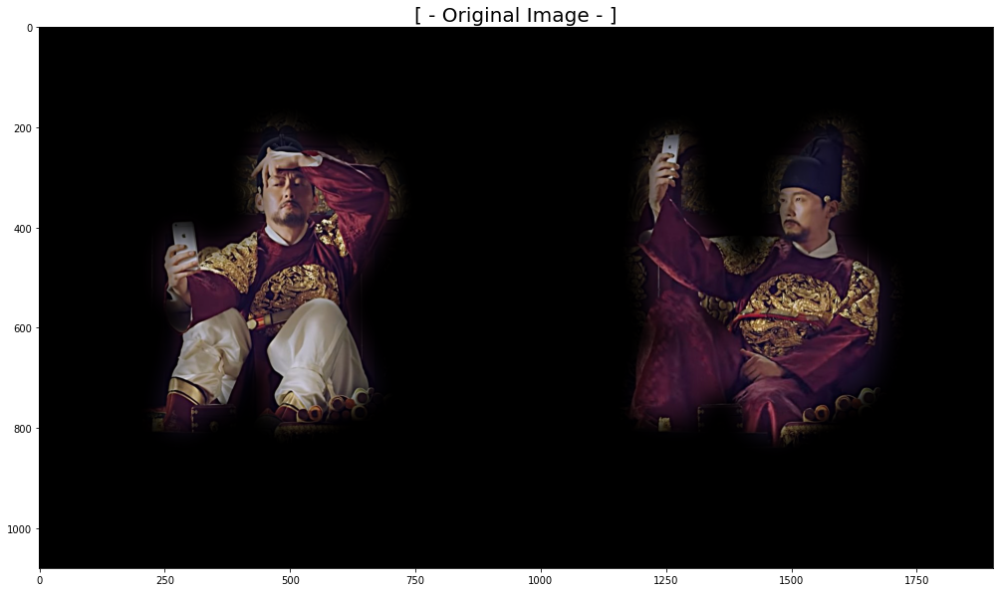

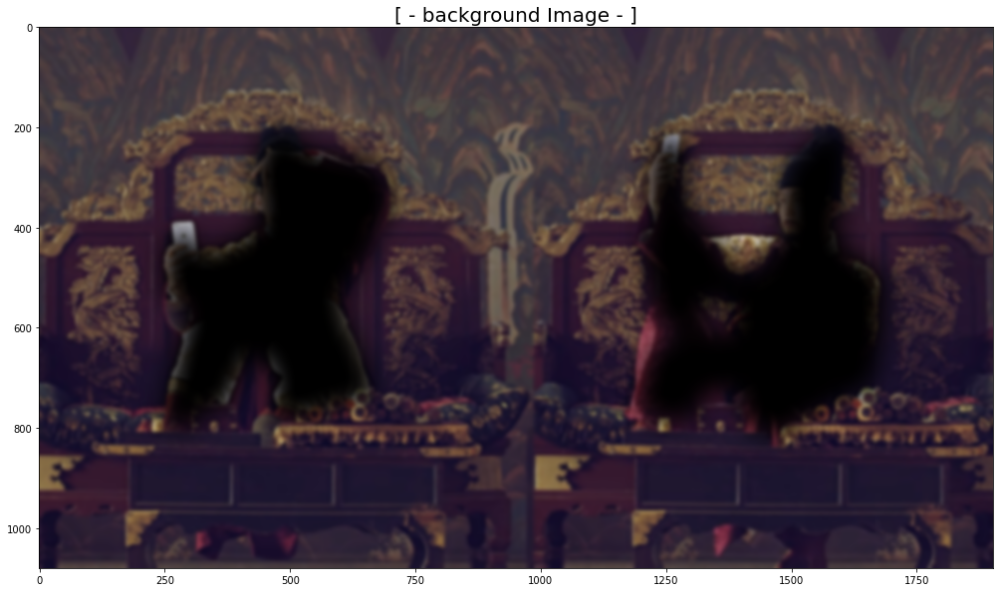

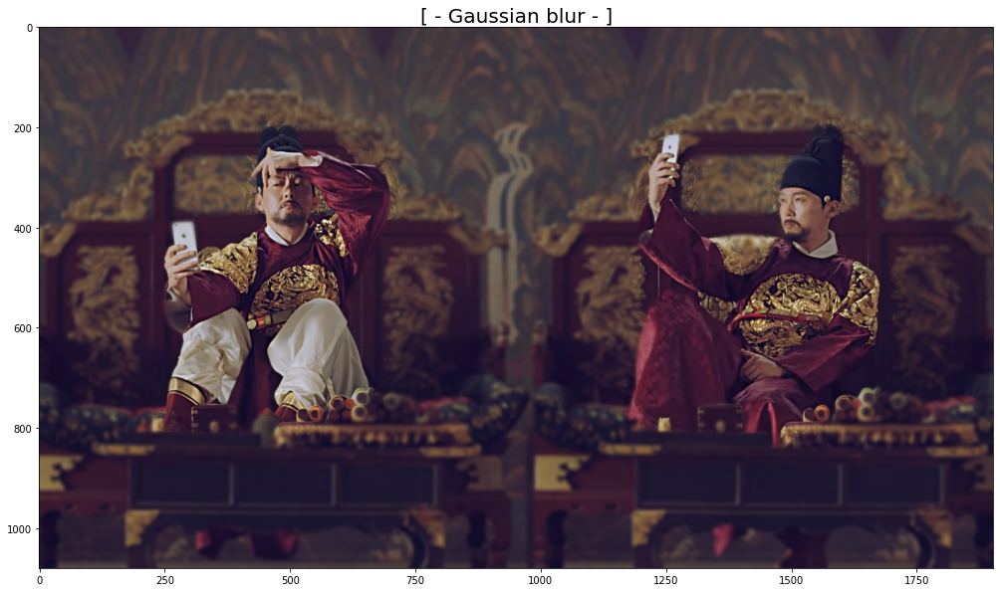

In [ ]:
# 사진의 크기를 맞춘뒤에 색상 분리
img_mask_up = cv2.resize(img_mask, img_orig.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)
img_mask_3C = np.repeat(np.expand_dims(img_mask_up, axis = 2), 3, axis=2).astype(np.uint8)

# 원본 이미지와 마스크를 따로 가우시안 블러 적용
img_orig_gblur = cv2.GaussianBlur(img_orig, (25,25),0)
img_mask_gblur = (cv2.GaussianBlur(img_mask_3C, (101, 101), 25, 25)/255).astype(np.float32)
img_gblur_mask_orig = img_mask_gblur * img_orig.astype(np.float32)

# 1-마스크를 해주는 이유는 블러 처리한 원본에서 배경만 뽑아내고자 하기 때문
img_bg_gmask = (1 - img_mask_gblur) * img_orig_gblur.astype(np.float32)
output = (img_gblur_mask_orig + img_bg_gmask).astype(np.uint8)

# 이미지 출력
plt.imshow(cv2.cvtColor(img_gblur_mask_orig.astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.title('[ - Original Image - ]', fontsize='20')
plt.show()

plt.imshow(cv2.cvtColor(img_bg_gmask.astype(np.uint8),cv2.COLOR_BGR2RGB))
plt.title('[ - background Image - ]', fontsize='20')
plt.show()

plt.imshow(cv2.cvtColor(output,cv2.COLOR_BGR2RGB))
plt.title('[ - Gaussian blur - ]', fontsize='20')
plt.show()

- 각기 이미지의 과정들이 정상적으로 진행된 것을 확인할 수 있다. 가우시안 블러의 경우 포토샵에서도 블러가 부드럽게 처리되는 기능인데, 이걸 파이썬에서 구현한다는 건 참신한 경험이었다. 그렇게 합성된 이미지 역시 앞서 단순한 블러를 입힌 것보다 경계가 훨씬 부드럽게 먹힌 것을 확인할 수 있어다.

= 따라서 앞서 블러를 먹인 배경에 대한 세그멘테이션을 좀 더 개선할 수 있는 방법으로 사용할 수 있다고 판단했다.

<br>

### 2-2. 다른 이론들 둘러보기

#### 1. 단일 카메라를 이용한 3D 깊이 추정

![20220609122839](https://user-images.githubusercontent.com/100528803/172758160-aed1387c-aa21-433d-b551-37b0043940bc.png)
![20220609122900](https://user-images.githubusercontent.com/100528803/172758163-b575089c-5ab0-444e-bd63-2b9109d2809e.png)
![20220609122913](https://user-images.githubusercontent.com/100528803/172758165-b5460024-3674-4fa5-9374-cc19d7810493.png)


단순히 평면적인 사진의 특성에 DFD를 통해서 흐림 정도의 크기를 계산해 깊이를 표현한다는 이론인데, 광각같은 효과를 주는게 목표가 아닐까 생각했다. 사실 요즘 스마트폰에는 대다수의 기능들이 비슷하게 구현되어 있기 때문에 이제는 우리 생활헤서 종종 보이는 기법이기도 하다. 한장의 사진에서 깊이까지 온전하게 다 뽑아낼 수 있다는 점은 얼핏 한계가 있어 보이지만, 최근 구글에서 만든 모델 중에는 몇장의 사진 만으로 3D 구현이 가능한 프로토 타입도 있기 때문에 대체 방안으로 적용해볼만하다고 생각했다.

#### 2. 모델 변경 : U-net

![20220609123311](https://user-images.githubusercontent.com/100528803/172758638-19b52d2c-4bcc-405d-8e68-1ebe79e5d674.png)
![20220609123324](https://user-images.githubusercontent.com/100528803/172758645-1faf953a-036e-4a30-ba60-40c9fd50f7f6.png)
![20220609123338](https://user-images.githubusercontent.com/100528803/172758647-ef857f2a-6c7a-4f99-af8d-211d4b374a95.png)

사실 앞서 시멘틱 세그멘 테이션의 경우 분할 단위 자체를 같은 존재를 한 레이블로 지정했기 때문에 마스크마다의 멀고 가까움을 측정하기가 어려운 부분이 있다. 이 경우 인스턴스 세그멘 테이션으로 아예 먼 거리나 서로 구도별로 다른 물체들을 구분해줘야할 필요성이 생긴다.

유넷은 시멘틱 세그맨테이션에 쓰이는 모델 중 하나로, 네트워크 형태 때문에 U라는 이름이 붙었다. 사실 여기서는 분류하는 양이 많지 않아 상관없지만, 연산속도 개선과 더불어 효율적인 모델 구조로 인해 좀더 섬세하게 사물을 구별하고 판별할 수 있다는 점에서 해결책의 하나로 손꼽을만 하다. 



#### 3. 딥랩의 업그레이드판 - CRF의 사용

![20220609123913](https://user-images.githubusercontent.com/100528803/172759298-1ee524b2-8193-4642-8ad2-46b51a794609.png)
![20220609123929](https://user-images.githubusercontent.com/100528803/172759301-4aad1dd2-de10-4743-9727-3a95377e8e29.png)
![20220609123945](https://user-images.githubusercontent.com/100528803/172759302-f7341b32-e54a-4142-a543-ce992b537144.png)
![20220609123954](https://user-images.githubusercontent.com/100528803/172759304-31b945af-1771-4e43-8b55-1e7da0380eca.png)

앞의 설명에서와 같이 Conditional Random Field를 짧게 줄여서 CRF라고 하는데, 픽셀 단위의 예측 과정 중에서 feature map 크기가 줄어들면 제대로 된 정보를 얻기가 힘들어진다. 따라서 CRP 과정을 후처리로 넣음으로서 정확도를 높이겠다는 방식이다.

간단하게 말하자면 줄어들었던 크기를 다시 원 크기로 확대시킴으로서 후보정쪽에서 정밀하게 값을 뽑아내겠다는 건데, 이렇게 하면 뭉뚱그려져서 제대로 잡을 수 없었던 특징들을 좀 더 섬세하게 잡아낼 수 있기 때문에 분류과정에서 더 상세한 처리가 가능해진다. 이는 따로 후처리 과정만 더 신경써주면 되는 부분이기 때문에 모델 자체나 사진 차제의 변경이랑은 다른 부분에서의 대체 과정으로 꼽을 수 있다.

## ✔️회고 및 결론
---

#### ▶️ 이번 프로젝트에서 어려웠던 점

처음에 마스크 값으로 라벨 뽑는게 좀 헷갈렸다. [128, 128, 192]가 사람 마스크 값이었는데 이게 그대로 들어가는게 아니라 반대인 [192, 128, 128]이다보니 왜 마스크가 안 뽑히지? 하고 고민했던 부분들에서 시간이 걸렸던 기억이 나지만, 노드 보고 다시 제대로 인식을 잡은 뒤에는 크게 헷갈리지 않았다.


<br>

#### ▶️ 프로젝트를 진행하면서 알아낸 점 혹은 아직 모호한 점

![멀티](https://user-images.githubusercontent.com/100528803/172689383-1d1eca90-7386-4ecf-be1e-1ec390bb7105.png)

라벨이 크게 '인간, 새, 개, 고양이'처럼 각각의 큰 객체들의 분리는 가능하지만, 섬세하게 어떤 객체가 뒤에 있거나 앞에있고의 마스크까지는 다 뽑지 못하기 때문에 인스턴스로의 분리가 더 필요하다는 생각이 들었다.

![세그멘테이션2](https://user-images.githubusercontent.com/100528803/172689363-bfc0fefb-0dfb-4749-a464-1ddd3724e6e2.png)

어떻게 보면 사람의 외형을 하고 있다고 볼 수 있는 애니메이션 크리처나 캐릭터의 경우에도 일반적인 사람의 형체가 아닐 경우, 전혀 사람으로 분간하지 못한다는 점이 가장 인상깊었다. 사실 이게 구분이 안되면 사실상 그림에서는 쓰이기 힘들어지기 때문에 다른 방법이 필요함을 느꼈던 순간이었다. 이 사진에 쓰인 마스크도 정작 새나 다른 물체들의 마스크 값의 합이지, 이 중에서 '사람' 라벨링으로는 인식되지 않았다.

<br>


#### ▶️ 루브릭 평가 지표를 맞추기 위해 시도한 것들

이번 프로젝트에서 루브릭의 기준은 아래와 같았다.

|       |                                    **< 평가문항 >**                                   |                                                              **< 상세기준 >**                                                             |
|-------|:---------------------------------------------------------------------------------|:-------------------------------------------------------------------------------------------------------------------------------------|
| **1** | 인물모드 사진을 성공적으로 제작하였다.<br>                                 | 아웃포커싱 효과가 적용된 본인의 인물모드 사진과 고양이 사진, 배경전환 크로마키사진을 각각 1장 이상 성공적으로 제작하였다.<br>                                                        |
| **2** | 제작한 인물모드 사진들에서 나타나는 문제점을 정확히 지적하였다.<br> | 인물사진에서 발생한 문제점을 정확히 지적한 사진을 제출하였다.                              |
| **3** | 인물모드 사진의 문제점을 개선할 수 있는 솔루션을 적절히 제시하였다.                                    | 추가적인 depth 정보를 활용하여 semantic segmentation mask의 오류를 보완할 수 있는 좋은 솔루션을 구체적으로 제시하였다. |

- 세그멘테이션과 기본 블러로 진행한 아웃포커싱

![다운로드 (3)](https://user-images.githubusercontent.com/100528803/172770222-410e89f2-d027-4b3a-9242-51e332fd913e.png)

<br>

- 가우시안 블러로 진행한 아웃포커싱

![다운로드 (2)](https://user-images.githubusercontent.com/100528803/172770230-90d86ff0-2c59-42a8-af38-673d867557da.png)

둘다 세그멘테이션을 이용해서 사람만 마스킹으로 분리한 뒤에 배경을 블러한 건데, 경계면이 또렷했던 처음 이미지와는 달리 가우시안 블러는 오히려 마스킹이 제대로 들어가지 않았음에도 불구하고 전체적으로 깔끔하게 잘 어우러지는 사진이 완성되었다.

<br>

- 배경 크로마키로 합성한 사진

![다운로드](https://user-images.githubusercontent.com/100528803/172770481-1f37fb74-8fdc-457c-811d-8eb1cc030d14.png)

사실 배경 자체가 원본 이미지에 맞춰서 비율이 눌린건 있는데, 이대로도 잘 어울려서 따로 수정하지는 않았다. 굳이 무거운 포토샵을 틀지 않고도 적당히 틀만 맞추면 전부 이런식으로 이미지 편집이 가능하겠구나 싶어 희망이 보이기도 했다.

<br>

#### ▶️ 자기 다짐

사실 이런 종류의 이미지 편집같은 경우 워낙 포토샵으로 자주, 그리고 많이 진행한 거라 파이썬으로 굳이 작업할 필요가 있는지 처음에는 의구심이 들었지만, 나중에는 점차 생각이 바뀌었던 기억이 난다. 이게 한두장 파일이면 그렇겠지만, 나중에 수천장의 이미지를 한꺼번에 작업하게 된다면 아마 압도적인 효율이 나올 수 있을 거고, 정밀하게 세팅만 잘해둔다면 원하는 이미지들을 몇개의 코드 실행만으로 만들 수 있을거라는게 개인적으로 가슴뛰게 만들었던 시간이었다.

<br>

<br>

## ✔️Reference(참고자료)
---
* http://www.kibme.org/resources/journal/20190411153555246.pdf
* https://locofield.com/5
* https://tech.socarcorp.kr/data/2020/02/13/car-damage-segmentation-model.html
* https://github.com/PEBpung/Aiffel/blob/master/Project/Exploration/E14.%20Image%20segmentation%EC%9D%84%20%EC%9D%B4%EC%9A%A9%ED%95%9C%20Portrait%20mode%20%EB%A7%8C%EB%93%A4%EA%B8%B0..ipynb
* https://nbviewer.org/github/westyeon/EXPLORATION_IC1/blob/master/Exploration08-Semantic_segmentation.ipynb
* https://m.blog.naver.com/laonple/221017461464